In [1]:
import os
os.chdir("../")
os.getcwd()

'/home/pg221/Desktop/PhD_Projects/Mori-Zwanzig-Autoencoder'

In [2]:
import torch
from torch.utils.data import Dataset, DataLoader
# from utils.PreProc_Data.DataProc_TM2 import StackedSequenceDataset
import numpy as np
from src.MZA_Experiment import MZA_Experiment
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from src.PreProc_Data.DataProc import SequenceDataset
from src.PreProc_Data.DataProc import StackedSequenceDataset
from time import time
# from MZA_Experiment import MZA_Experiment

%matplotlib widget

In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps") 
else:
    device = torch.device("cpu")

Model testing

DATA Testing

In [4]:
data = np.load("Data/ExpData/velocity.npy")
# data = np.einsum('ijk->jki',data)
data.shape


(13, 5986, 2, 50, 53)

In [5]:
def collate_fn(batch_ps, batch_pn):
    
        t_bps, t_bpn = batch_ps, batch_pn
        for i in range(t_bps.ndim-1):
            if i == 0:
                t_bps = torch.all(t_bps == 0, dim = -1)
                t_bpn = torch.all(t_bpn == 0, dim = -1)
            else:
                t_bps = torch.all(t_bps == True, dim = -1)
                t_bpn = torch.all(t_bpn == True, dim = -1)
        
        return batch_ps[~t_bps], batch_pn[~t_bpn]

In [6]:
# seqdataset = SequenceDataset(data, device, sequence_length=5, pred_horizon = 1)

sequence_length=100
pred_horizon = 2

statedata = np.moveaxis(data, 0, -1)    #[timesteps, statedim, num_traj]
# self.Phi = torch.tensor(self.statedata, device=self.device).float()
Phi = torch.tensor(statedata, device="cpu").float()
le = Phi.shape[0]
print(le-1-pred_horizon)
print(statedata.shape[1])
non_time_dims = (1,)*(statedata.ndim-1)   #dims apart from timestep in tuple form (1,1...)
i=6000
flag = False
if i > (le-1-pred_horizon):
    print("in extreme case")
    flag = True
    Phi_seq = torch.zeros((statedata.shape[-1], sequence_length, *statedata.shape[1:-1]))
    Phi_nn  = torch.zeros((statedata.shape[-1], pred_horizon, *statedata.shape[1:-1]))
    # return Phi_seq, Phi_nn
    # raise StopIteration("End of dataset reached.")
if i >= sequence_length:
    i_start = i - sequence_length + 1
    pi = i-i_start
    inuse_Phi = Phi[i_start:i+pred_horizon+1]#.to(self.device)
    phi = inuse_Phi[0:(pi+1), ...]
elif i==0:
    pi = 0
    inuse_Phi = Phi[0:i+pred_horizon+1]#.to(self.device)
    phi = inuse_Phi[0:(i+1), ...]
    padding = torch.zeros(inuse_Phi[0].repeat(sequence_length - 1, *non_time_dims).shape)#.to(self.device)
    phi = torch.cat((padding, phi), 0)
else:
    pi = i
    inuse_Phi = Phi[0:i+pred_horizon+1]#.to(self.device)
    padding = torch.zeros(inuse_Phi[0].repeat(sequence_length - i-1, *non_time_dims).shape)#.to(self.device)
    # padding = self.Phi[0].repeat(self.sequence_length - 1, *non_time_dims).shape).to(self.device)
    phi = inuse_Phi[0:(i+1), ...]
    phi = torch.cat((padding, phi), 0)

if not flag:
    Phi_seq = torch.movedim(phi, -1, 0)
    Phi_nn  = torch.movedim(inuse_Phi[pi+1:], -1, 0)  #includes all the future timesteps because not at the end of dataset 

    Phi_seq = Phi_seq#.to("cpu")
    Phi_nn  = Phi_nn#.to("cpu")

print(Phi_seq.shape)
print(Phi_nn.shape)

# print(Phi_seq)
# a,b = collate_fn(Phi_seq,Phi_nn)
# print(a.shape)
# print(b.shape)

torch.all(Phi_seq == 0, dim = -1).shape
# return Phi_seq, Phi_nn

5983
2
in extreme case
torch.Size([13, 100, 2, 50, 53])
torch.Size([13, 2, 2, 50, 53])


torch.Size([13, 100, 2, 50])

Testing Dataset and Dataloader

In [24]:
seqdataset = SequenceDataset(data, device, sequence_length=10, pred_horizon = 2)
seqdataloader = DataLoader(seqdataset, batch_size=5000, shuffle = False, num_workers = 0)
iti = iter(seqdataloader)

In [25]:
a,b = next(iti)
print(a.shape)
print(b.shape)
print(len(seqdataset))

torch.Size([5000, 13, 10, 2, 50, 53])
torch.Size([5000, 13, 2, 2, 50, 53])
5986


In [26]:
def collate_fn(batch_ps, batch_pn):
    
        t_bps, t_bpn = batch_ps, batch_pn
        for i in range(t_bps.ndim-1):
            if i < 3:
                t_bps = torch.all(t_bps == 0, dim = -1)
                t_bpn = torch.all(t_bpn == 0, dim = -1)
            else:
                t_bps = torch.all(t_bps == True, dim = -1)
                t_bpn = torch.all(t_bpn == True, dim = -1)
        
        return batch_ps[~t_bps], batch_pn[~t_bpn]

def stack_data(seqdataloader, seqdataset):
    
    it = iter(seqdataloader)
    start_time = time()
    Phi_seq, Phi_nn = next(it)
    end_time = time()
    print("Time: ", end_time - start_time)

    print("shapes: ", Phi_seq.shape)
    
    Phi_seq, Phi_nn = collate_fn(Phi_seq, Phi_nn)

    print(Phi_seq.shape, Phi_nn.shape)
    Phi_seq = torch.flatten(Phi_seq, start_dim = 0, end_dim = 1)  #(batchsize*num traj seqlen statedim)
    Phi_nn  = torch.flatten(Phi_nn, start_dim = 0, end_dim = 1) 

    j=0
    for i, data in enumerate(seqdataloader):
        
        if (j+1 > (len(seqdataset)-1-pred_horizon)):
            break
        elif (i!=0):
            data0, data1 = data[0], data[1]
            print("data before collate: ", data0.shape, data1.shape)
            data0, data1 = collate_fn(data0, data1)
            print("data after collate: ", data0.shape, data1.shape)
            data0   = torch.flatten(data0, start_dim = 0, end_dim = 1)
            data1   = torch.flatten(data1, start_dim = 0, end_dim = 1) 
            Phi_seq = torch.cat((Phi_seq, data0), dim = 0)
            Phi_nn  = torch.cat((Phi_nn, data1), dim = 0)
        
        j+=data[0].shape[0]
        print(j)

    return Phi_seq, Phi_nn

a,b = stack_data(seqdataloader, seqdataset)

print(a.shape)
print(b.shape)

b[-1]

Time:  2.291980504989624
shapes:  torch.Size([5000, 13, 10, 2, 50, 53])
torch.Size([5000, 13, 10, 2, 50, 53]) torch.Size([5000, 13, 2, 2, 50, 53])
5000
data before collate:  torch.Size([986, 13, 10, 2, 50, 53]) torch.Size([986, 13, 2, 2, 50, 53])
data after collate:  torch.Size([984, 13, 10, 2, 50, 53]) torch.Size([984, 13, 2, 2, 50, 53])
5986
torch.Size([77792, 10, 2, 50, 53])
torch.Size([77792, 2, 2, 50, 53])


tensor([[[[ 1.0374e+00,  1.0070e+00,  1.0395e+00,  ...,  9.5359e-01,
            9.2962e-01,  9.4409e-01],
          [ 1.0147e+00,  1.0269e+00,  1.0277e+00,  ...,  9.4512e-01,
            9.6004e-01,  9.7176e-01],
          [ 9.1333e-01,  9.8883e-01,  9.8264e-01,  ...,  9.9312e-01,
            9.5832e-01,  1.0043e+00],
          ...,
          [ 9.9891e-01,  1.0113e+00,  1.0096e+00,  ...,  9.4790e-01,
            9.4937e-01,  9.8657e-01],
          [ 1.0499e+00,  1.0486e+00,  1.0389e+00,  ...,  9.4702e-01,
            9.3807e-01,  9.5956e-01],
          [ 1.0517e+00,  1.0474e+00,  1.0644e+00,  ...,  9.2401e-01,
            9.7315e-01,  9.5026e-01]],

         [[-6.6385e-02, -1.0623e-02,  4.3162e-02,  ..., -2.4675e-02,
            2.9573e-02, -1.5202e-02],
          [-3.8273e-02, -3.4327e-03,  2.4465e-02,  ...,  8.6683e-03,
           -9.3828e-03, -3.2581e-02],
          [-1.2351e-01, -4.3095e-02,  4.9873e-02,  ..., -9.3768e-03,
           -2.5147e-03,  8.9841e-03],
          ...,
     

In [27]:
a[-1,4,0,...]

tensor([[1.0182, 1.0003, 1.0565,  ..., 1.0621, 1.0273, 1.0244],
        [1.0229, 1.0017, 0.9935,  ..., 0.9905, 0.9852, 0.9773],
        [0.9596, 0.9394, 0.9170,  ..., 1.0043, 0.9952, 1.0351],
        ...,
        [1.0281, 1.0285, 1.0274,  ..., 0.9559, 0.9634, 0.9546],
        [1.0556, 1.0606, 1.0464,  ..., 0.9469, 0.9547, 0.9877],
        [1.0382, 1.0693, 1.0556,  ..., 0.9534, 0.9309, 0.9416]])

(50, 53) (50, 53)


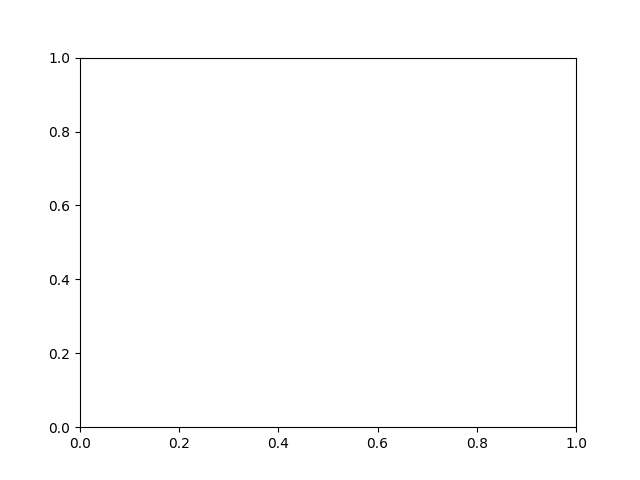

ERROR:tornado.application:Exception in callback <bound method TimerBase._on_timer of <matplotlib.backends.backend_webagg_core.TimerTornado object at 0x7f4b596f2bf0>>
Traceback (most recent call last):
  File "/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/tornado/ioloop.py", line 921, in _run
    val = self.callback()
  File "/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/matplotlib/backend_bases.py", line 1226, in _on_timer
    ret = func(*args, **kwargs)
  File "/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/matplotlib/animation.py", line 1426, in _step
    still_going = super()._step(*args)
  File "/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/matplotlib/animation.py", line 1119, in _step
    self._draw_next_frame(framedata, self._blit)
  File "/home/pg221/anaconda3/envs/KS/lib/python3.10/site-packages/matplotlib/animation.py", line 1138, in _draw_next_frame
    self._draw_frame(framedata)
  File "/home/pg221/anaconda3/envs/KS/lib/pyt

In [32]:
x = np.arange(data.shape[-1])
y = np.arange(data.shape[-2])

X,Y = np.meshgrid(x,y)
print(X.shape, Y.shape)

# plt.contourf(X,Y,data[1,1,0,...])
fig, ax = plt.subplots()

def update(frame):
    ax.cla()  # Clear the previous frame
    Z = a[-1,frame,0,...]# Update the data for the new frame
    contour = ax.contourf(X, Y, Z, levels=20)
    return contour

ani = FuncAnimation(fig, update, frames=12, repeat=False)
# ani.save("animation1.gif")
plt.show()

In [4]:
dataset = StackedSequenceDataset(data, device)
it = iter(dataset)
Phi_seq, Phi_n, Phi_nn, index = next(it)
print(Phi_seq.shape)
print(Phi_nn.shape)
print(len(dataset))
index

/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help`
       for usage information.

/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help`
       for usage information.



torch.Size([5, 2])
torch.Size([2])
52920


0

In [5]:
dataloader = DataLoader(dataset, batch_size = 16, shuffle =True)

it = iter(dataloader)
Phi_seq, Phi_n, Phi_nn, index = next(it)
print(Phi_seq.shape)
print(Phi_nn.shape)
print(index.shape)

print(len(dataset))

torch.Size([16, 5, 2])
torch.Size([16, 2])
torch.Size([16])
52920


In [9]:
dataset.residuals[index] = torch.arange(1,17)[:,None]

dataset.residuals[dataset.residuals != 0]  

array([13.,  6.,  3.,  5., 16., 15., 10., 14.,  9.,  4.,  1.,  2., 11.,
        7., 12.,  8.])

In [4]:
seqdataset = SequenceDataset(data, device)
# dataloader = DataLoader(dataset, batch_size = 16, shuffle =True)

/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help`
       for usage information.

/usr/bin/nvidia-modprobe: unrecognized option: "-s"

ERROR: Invalid commandline, please run `/usr/bin/nvidia-modprobe --help`
       for usage information.



In [6]:
it = iter(seqdataset)
Phi_seq, Phi_nn = next(it)
for i, data in enumerate(seqdataset):
    if (i!=0):
        Phi_seq = torch.cat((Phi_seq, data[0]), dim = 0)
        Phi_nn  = torch.cat((Phi_nn, data[1]), dim = 0)
print(Phi_seq.shape)
print(Phi_nn.shape)
   


torch.Size([52920, 5, 2])
torch.Size([52920, 2])
